In [2]:
%matplotlib inline

In [3]:
import matplotlib.pyplot as plt
import numpy as np

In [6]:
import build_markov
# reload(build_markov)

In [7]:
model = build_markov.dim_red_builder(num_sample_points = 10000,
                                     Regime= "kerr_bistable", 
                                     name = 'kerr_bistable_test',
                                     sample_type = 'first_n',
                                    )

In [9]:
model.run_diffusion_map(eig_upper_bound = 7,eps = 0.5,)  

In [13]:
model.save()

In [14]:
model.load()

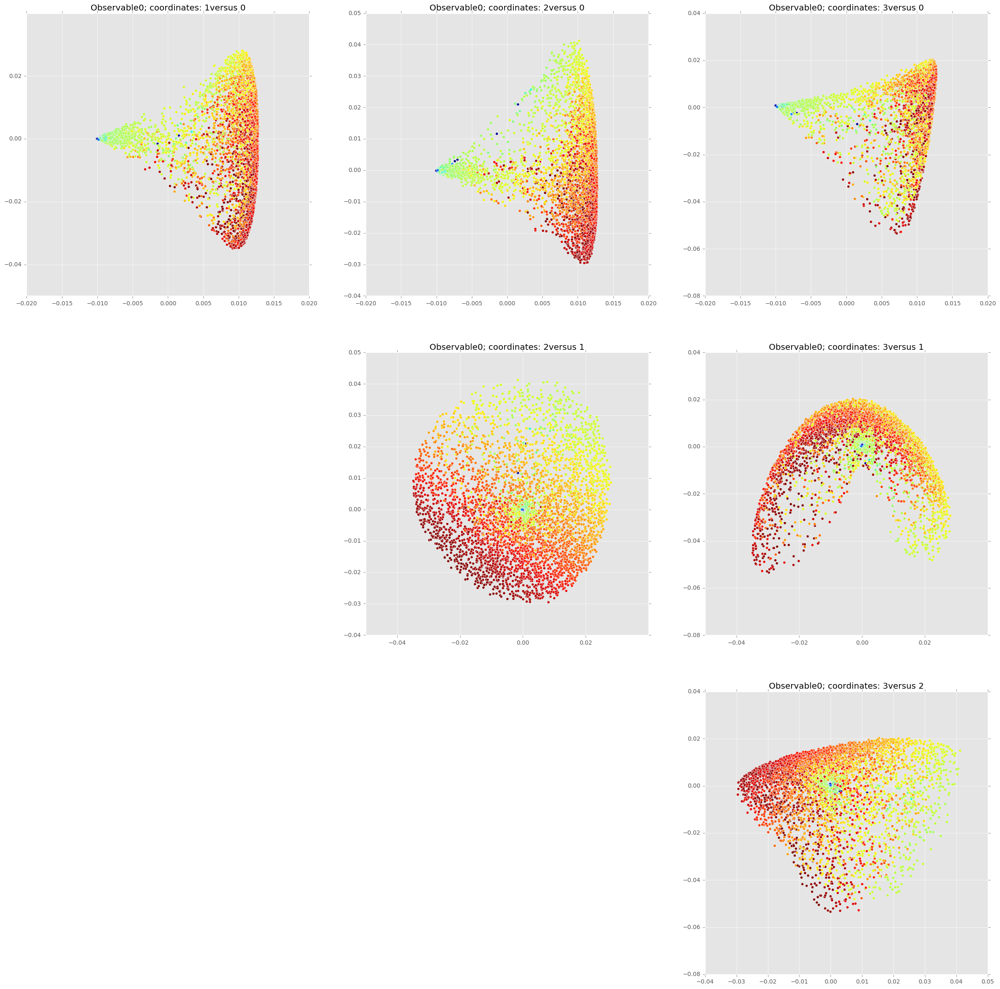

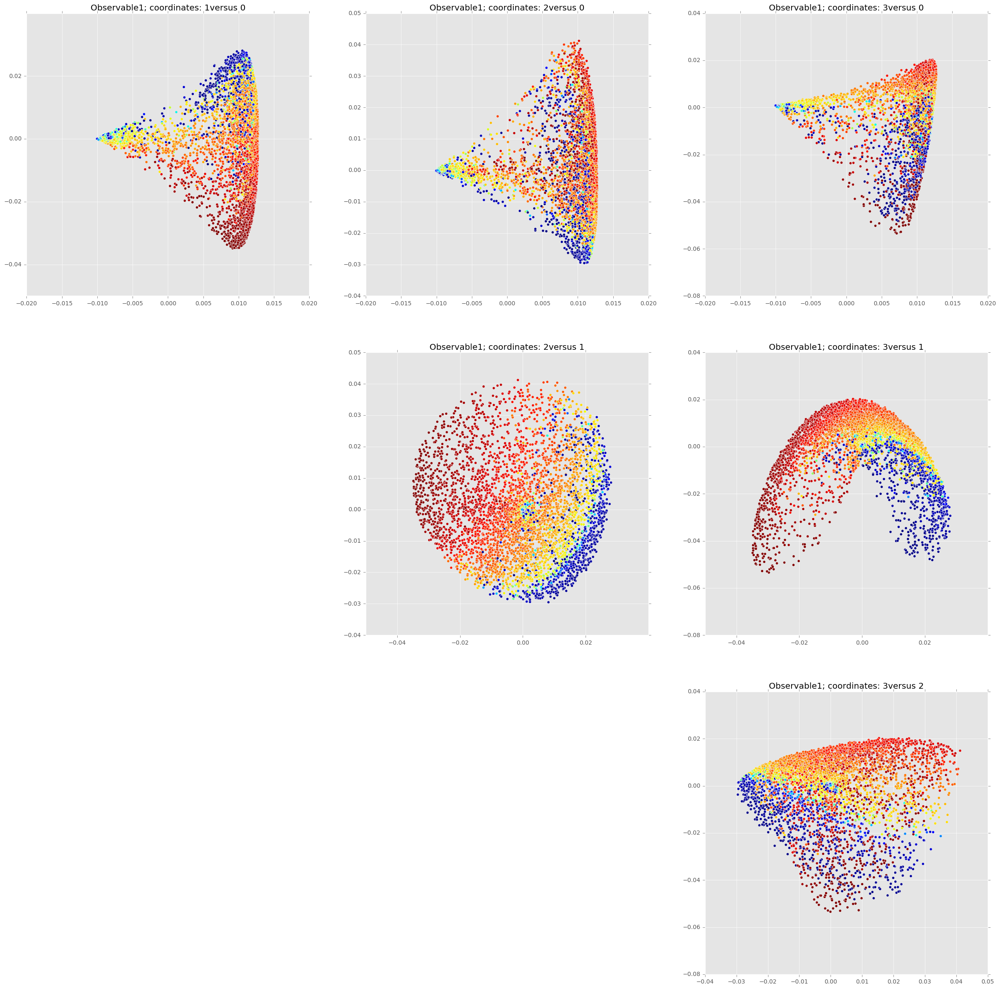

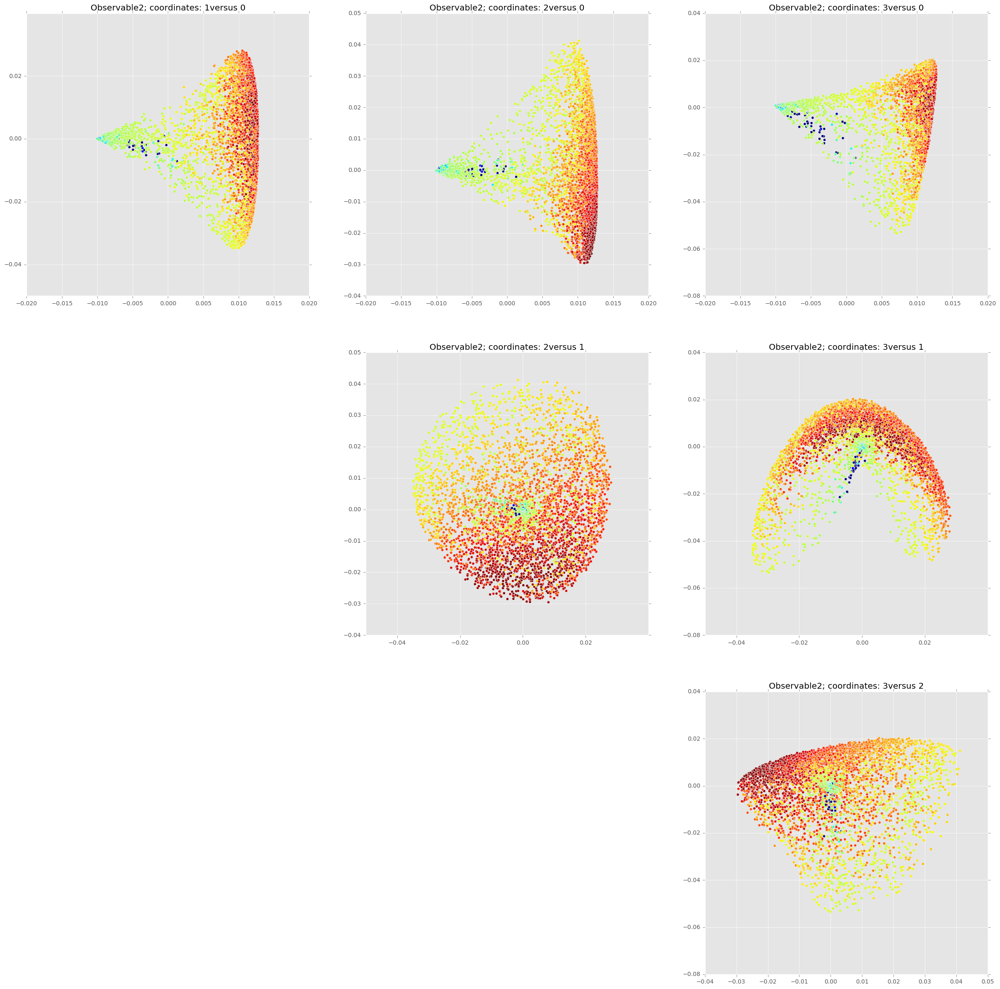

In [15]:
model.plot_diffusion_v_diffusion()

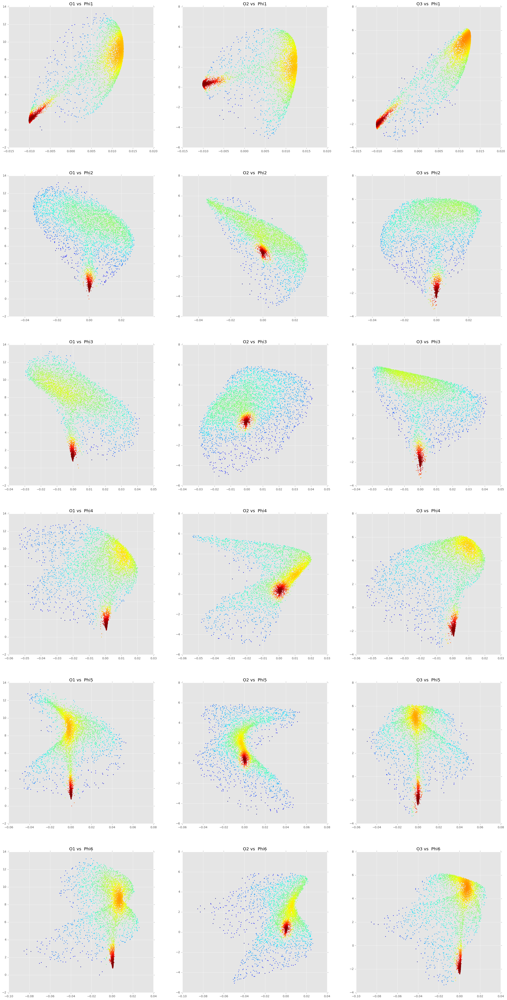

In [16]:
model.plot_obs_v_diffusion()

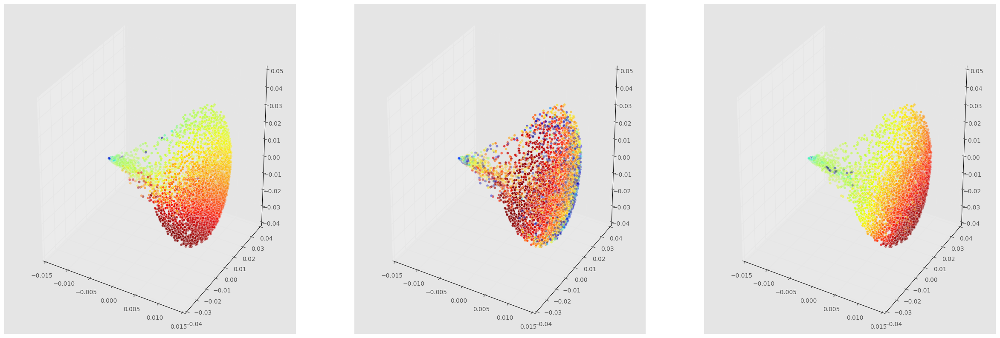

In [17]:
model.plot_diffusion_3d()

In [18]:
builder = build_markov.markov_model_builder(model)

In [84]:
builder.build_model(n_clusters=13,n_iter=100,random_state=1,covariance_type='full',num_diff_coords=4)

/Users/gil/anaconda/envs/python_3_env/lib/python3.5/site-packages/sklearn/utils/deprecation.py:70: DeprecationWarning: Function distribute_covar_matrix_to_match_covariance_type is deprecated; The functon distribute_covar_matrix_to_match_covariance_typeis deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/Users/gil/.local/lib/python3.5/site-packages/hmmlearn/base.py:429: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  framelogprob = self._compute_log_likelihood(X[i:j])
/Users/gil/anaconda/envs/python_3_env/lib/python3.5/site-packages/sklearn/utils/deprecation.py:70: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/Users/gil/.local/lib/python3.5/site-packages/hmmlearn/base.py:435: VisibleDeprecationWarn

converged True


/Users/gil/anaconda/envs/python_3_env/lib/python3.5/site-packages/sklearn/utils/deprecation.py:70: DeprecationWarning: Function log_multivariate_normal_density is deprecated; The function log_multivariate_normal_density is deprecated in 0.18 and will be removed in 0.20.
  warnings.warn(msg, category=DeprecationWarning)
/Users/gil/.local/lib/python3.5/site-packages/hmmlearn/base.py:451: RuntimeWarning: divide by zero encountered in log
  n_samples, n_components, np.log(self.startprob_),
/Users/gil/.local/lib/python3.5/site-packages/hmmlearn/base.py:452: RuntimeWarning: divide by zero encountered in log
  np.log(self.transmat_), framelogprob)


In [85]:
builder.save()

In [86]:
builder.load()

In [87]:
# reload(build_markov)
# builder2 = build_markov.markov_model_builder(model)
# builder2reload(build_markov)
# builder2 = build_markov.markov_model_builder(model).build_model(n_clusters=5,n_iter=1000,tol = 1e-4,random_state=1,covariance_type='full')
# builder2.status

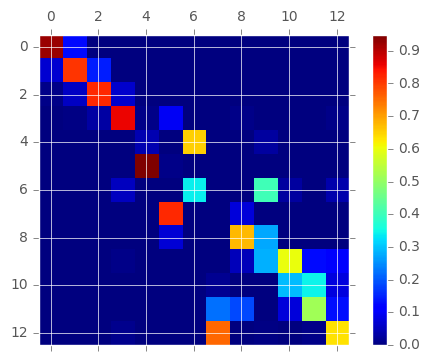

In [88]:
builder.plot_transition_matrix(obs_index = 0)

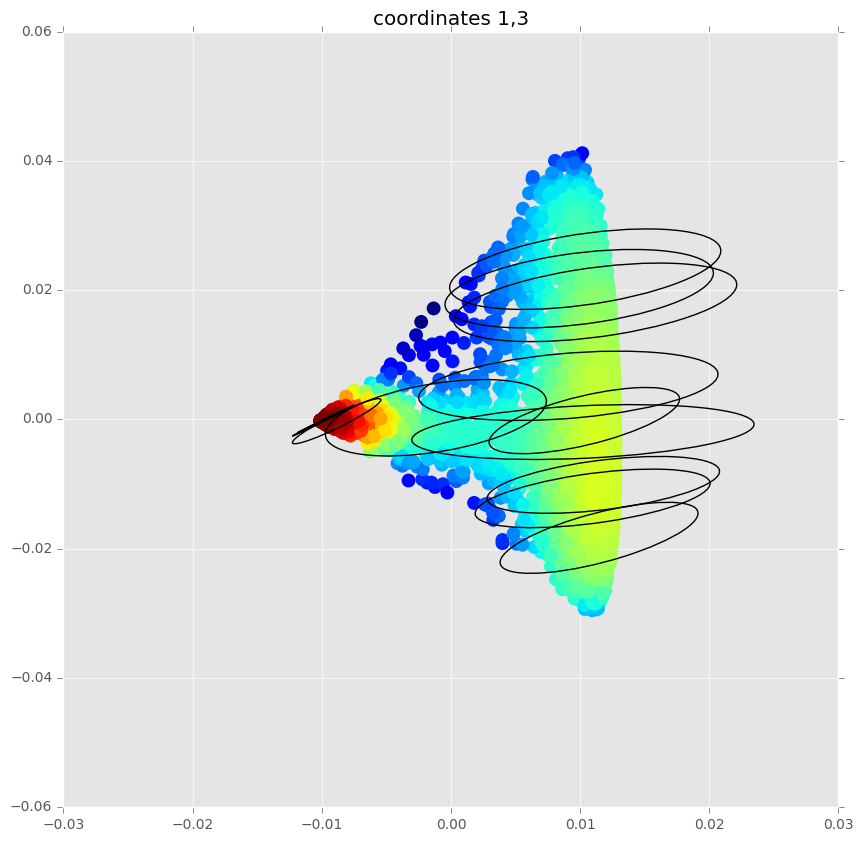

In [89]:
builder.ellipses_plot(indices=[0,2])

In [90]:
# builder.build_model(n_clusters=2000,method='agg_clustering')

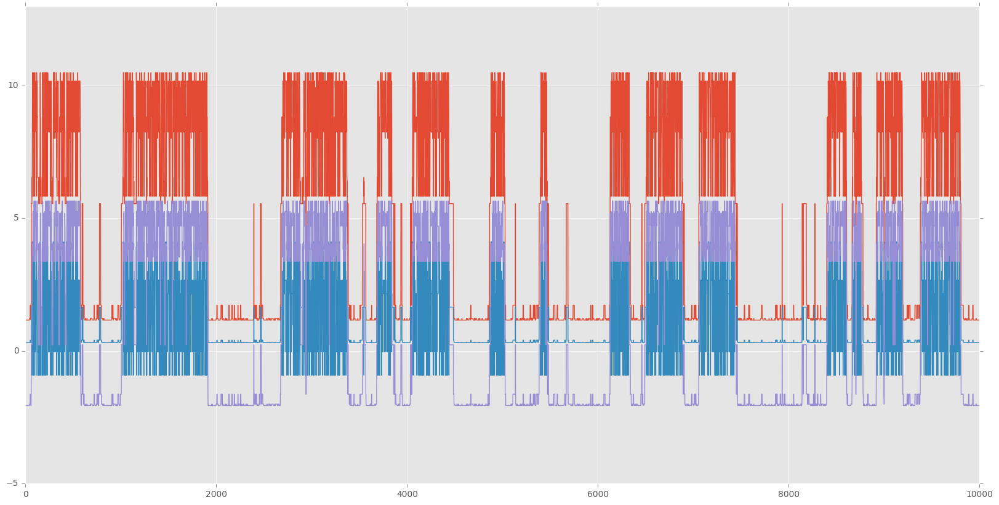

In [98]:
plt.figure(figsize=(20,10))
plt.plot(np.asarray(builder.generate_obs_traj(10000,random_state=2)).T);
plt.ylim(-5,13);

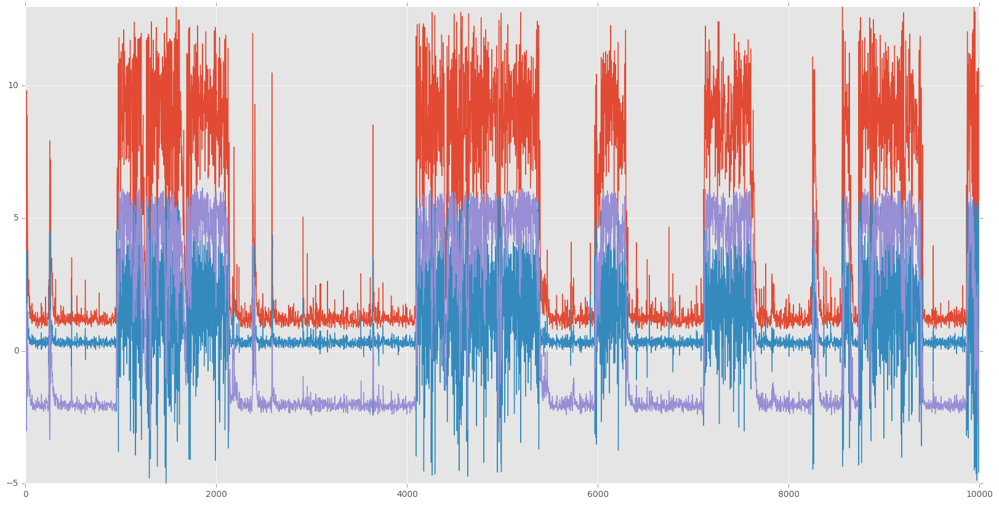

In [99]:
plt.figure(figsize=(20,10))
plt.plot(model.traj_expects.T[:10000]);
plt.ylim(-5,13);

### what observables look like...

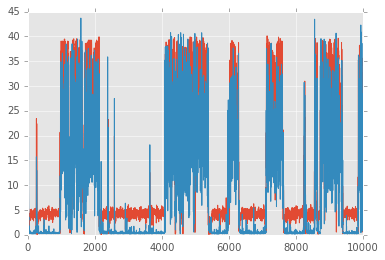

In [117]:
## X*2+P^2
plt.plot(abs(model.traj_expects[1].T[:10000])**2 + abs(model.traj_expects[2].T[:10000])**2)

## N^2 ~ (X^2 + P^2)/4
plt.plot(abs(model.traj_expects[0].T[:10000])**2/4.)

## Notes:

agg_clustering seems to work well for large cluster values (more than 100 or so). 
hmm works for small cluster numbers (and is too slow for large cluster numbers),
but not for all trajectories. Those starting at time 0 seem to work well,
but those starting later do no seem to get the right values.
hmm seems to fail for too few diffusion coordinates. 6 seems to work well, but it almost never works for 3 or 4.

All the above seem to hold for the other example in build_markov_absorptive.